Fuente: https://www.kaggle.com/teampycaret/mobile-price-prediction-multiclass-using-pycaret

## **Contexto del Problema**

Bob ha iniciado su propia empresa de telefonía móvil. Quiere dar una dura batalla a las grandes empresas como Apple, Samsung, etc.

No sabe cómo estimar el precio de los móviles que crea su empresa. En este competitivo mercado de la telefonía móvil, no se pueden simplemente asumir cosas. Para solucionar este problema, recopila datos de ventas de teléfonos móviles de varias empresas.

Bob quiere averiguar alguna relación entre las características de un teléfono móvil (por ejemplo: - RAM, memoria interna, etc.) y su precio de venta. Pero no es tan bueno en Machine Learning. Entonces necesita tu ayuda para resolver este problema.

En este problema, no tiene que predecir el precio real, sino un rango de precios que indica qué tan alto es el precio.
Nota: Si se buscara predecir el precio exacto sería un problema de regresión

# ------------------------  Ejercicios Practicos. Parte 1 ---------

# Instalación de PyCaret

In [70]:
#!pip install pycaret
#!pip install pandas-profiling

# Carga del dataset

In [71]:
import pandas as pd
train = pd.read_csv('data/train.csv')
train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


## Analisis Exploratorio (EDA)

In [72]:
from pandas_profiling import ProfileReport
import pandas as pd
## Realiza un analisis exploratorio utilizando la libreria PipelineProfiler

In [1]:
## Comprueba la distribucion de datos en funcion de la clase

¿Que conclusiones sacas?¿Son balanceados los datos?

# Inicilización del Entorno

In [2]:
from pycaret.classification import *
## Inicia el entorno como clf1 aplicando los ajustes necesarios en funcion de las concluisones obtenidas del EDA

#silent is True to perform unattended run when kernel is executed.

# Comparación de Modelos

In [75]:
## ¿Que tipo de metrica es recomendable analizar en este tipo de problema (multicalse) para estimar la calidad del modelo?

In [77]:
%%time
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,CatBoost Classifier,0.9263,0.0000,0.9261,0.9288,0.9259,0.9017,0.9028,4.7776
1,Logistic Regression,0.9148,0.0000,0.9147,0.9156,0.9143,0.8864,0.8870,0.0921
2,Linear Discriminant Analysis,0.9126,0.0000,0.9124,0.9158,0.9129,0.8834,0.8843,0.0162
3,Light Gradient Boosting Machine,0.9017,0.0000,0.9018,0.9039,0.9014,0.8689,0.8698,0.6442
4,Extreme Gradient Boosting,0.8945,0.0000,0.8944,0.8971,0.8939,0.8593,0.8605,0.6013
5,Gradient Boosting Classifier,0.8930,0.0000,0.8930,0.8948,0.8923,0.8573,0.8583,1.8623
6,Decision Tree Classifier,0.8143,0.0000,0.8142,0.8184,0.8139,0.7523,0.7539,0.0140
7,Extra Trees Classifier,0.7731,0.0000,0.7734,0.7697,0.7679,0.6975,0.6995,0.2526
8,SVM - Linear Kernel,0.7674,0.0000,0.7672,0.7688,0.7625,0.6898,0.6936,0.1071
9,Random Forest Classifier,0.7095,0.0000,0.7099,0.7112,0.7063,0.6126,0.6148,0.1113


Wall time: 2min 43s


Para fines de comparación, usaremos la puntuación `F1`. Observa cuán drásticamente han mejorado algunos de los algoritmos después de que realizamos el preprocesamiento en `setup ()`.

- El F1 de regresión logística mejoró de `0.51` a `0.7804`
- El F1 de Naives Bayes mejoró de `0.35` a `0.7533`
- Ell F1 de KNN mejoró de `0.61` a` 0.7004`

In [78]:
%%time
## identifica los tres mejores modelos (top3) en base al F1. Para ello entrena y evalua diferentes modelos

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,CatBoost Classifier,0.9263,0.0000,0.9261,0.9288,0.9259,0.9017,0.9028,4.6531
1,Logistic Regression,0.9148,0.0000,0.9147,0.9156,0.9143,0.8864,0.8870,0.0832
2,Linear Discriminant Analysis,0.9126,0.0000,0.9124,0.9158,0.9129,0.8834,0.8843,0.0172
3,Light Gradient Boosting Machine,0.9017,0.0000,0.9018,0.9039,0.9014,0.8689,0.8698,0.6459
4,Extreme Gradient Boosting,0.8945,0.0000,0.8944,0.8971,0.8939,0.8593,0.8605,0.6045
5,Gradient Boosting Classifier,0.8930,0.0000,0.8930,0.8948,0.8923,0.8573,0.8583,1.8236
6,Decision Tree Classifier,0.8143,0.0000,0.8142,0.8184,0.8139,0.7523,0.7539,0.0143
7,Extra Trees Classifier,0.7731,0.0000,0.7734,0.7697,0.7679,0.6975,0.6995,0.2554
8,SVM - Linear Kernel,0.7674,0.0000,0.7672,0.7688,0.7625,0.6898,0.6936,0.1157
9,Random Forest Classifier,0.7095,0.0000,0.7099,0.7112,0.7063,0.6126,0.6148,0.1148


Wall time: 2min 44s


¿Cual dirias que es el mejor modelo?

# Creación del modelo

In [79]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors.KNeighborsClassifier,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model.SGDClassifier,True
rbfsvm,SVM - Radial Kernel,sklearn.svm.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process.GPC,False
mlp,MLP Classifier,sklearn.neural_network.MLPClassifier,False
ridge,Ridge Classifier,sklearn.linear_model.RidgeClassifier,True


In [4]:
## crea un modelo de Knn, haciendo una evaluacion cruzada de 5 y redondeando las metricas a 2 decimales


In [81]:
# create catboost model
catboost = create_model('catboost', round = 2)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.91,0.00,0.91,0.91,0.91,0.88,0.89
1,0.90,0.00,0.90,0.90,0.90,0.87,0.87
2,0.94,0.00,0.94,0.94,0.94,0.92,0.92
3,0.96,0.00,0.96,0.96,0.96,0.95,0.95
4,0.89,0.00,0.89,0.90,0.89,0.86,0.86
5,0.94,0.00,0.94,0.95,0.94,0.92,0.92
6,0.91,0.00,0.91,0.91,0.90,0.87,0.88
7,0.94,0.00,0.94,0.94,0.94,0.92,0.92
8,0.96,0.00,0.96,0.96,0.96,0.94,0.94
9,0.91,0.00,0.91,0.91,0.90,0.87,0.88


#  -------  Ejercicios Practicos. Parte 2 -----------

# Optimización del modelo

In [83]:
## optimiza el knn maximizando el F1 con 20 iteraciones

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7698,0.0000,0.7702,0.7759,0.7707,0.6931,0.6944
1,0.7482,0.0000,0.7479,0.7560,0.7511,0.6643,0.6649
2,0.8129,0.0000,0.8126,0.8144,0.8121,0.7506,0.7516
3,0.7482,0.0000,0.7471,0.7545,0.7488,0.6641,0.6659
4,0.6739,0.0000,0.6739,0.6873,0.6790,0.5651,0.5660
5,0.7681,0.0000,0.7691,0.7721,0.7668,0.6908,0.6928
6,0.7754,0.0000,0.7761,0.7814,0.7760,0.7004,0.7019
7,0.7101,0.0000,0.7116,0.7127,0.7076,0.6135,0.6158
8,0.7464,0.0000,0.7456,0.7502,0.7470,0.6618,0.6625
9,0.7319,0.0000,0.7315,0.7238,0.7252,0.6425,0.6442


In [84]:

print(tuned_knn)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=47, p=2,
                     weights='distance')


In [5]:
## muestra la configuracion del tunned_knn

In [6]:
## optimiza el catboost maximizando el F1 con 20 iteraciones

## Ensamblado de modelos

### Bagging

In [94]:
dt = create_model('dt')
## genera un modelo utilizando la tecnica de bagging a partir de un decision tree (dt)

print(bagged_dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8921,0.0000,0.8916,0.8937,0.8917,0.8561,0.8568
1,0.9065,0.0000,0.9059,0.9062,0.9056,0.8753,0.8757
2,0.8849,0.0000,0.8845,0.8861,0.8854,0.8465,0.8466
3,0.8849,0.0000,0.8849,0.8878,0.8854,0.8465,0.8471
4,0.8841,0.0000,0.8840,0.8905,0.8853,0.8454,0.8468
5,0.8841,0.0000,0.8840,0.8909,0.8854,0.8453,0.8468
6,0.8551,0.0000,0.8559,0.8553,0.8534,0.8067,0.8079
7,0.8841,0.0000,0.8840,0.8892,0.8853,0.8453,0.8462
8,0.9058,0.0000,0.9059,0.9102,0.9065,0.8744,0.8753
9,0.8841,0.0000,0.8847,0.8871,0.8811,0.8454,0.8481


BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=None,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=786,
 

##  Boosting

In [96]:
## genera un modelo utilizando la tecnica de boosting con un decision tree

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8273,0.0000,0.8267,0.8315,0.8265,0.7697,0.7715
1,0.8345,0.0000,0.8340,0.8332,0.8333,0.7794,0.7797
2,0.8489,0.0000,0.8487,0.8529,0.8503,0.7986,0.7990
3,0.8417,0.0000,0.8414,0.8432,0.8422,0.7890,0.7892
4,0.8043,0.0000,0.8040,0.8037,0.8038,0.7391,0.7393
5,0.7971,0.0000,0.7977,0.7975,0.7972,0.7295,0.7295
6,0.7971,0.0000,0.7981,0.7979,0.7965,0.7295,0.7301
7,0.8333,0.0000,0.8334,0.8459,0.8363,0.7776,0.7797
8,0.7681,0.0000,0.7693,0.7744,0.7661,0.6908,0.6941
9,0.8188,0.0000,0.8187,0.8202,0.8169,0.7584,0.7601


### Stacking

In [97]:
xgboost = create_model('xgboost')
## aplica stacking con los modelos del top3 y como meta-modelo el xgboost


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9137,0.0000,0.9132,0.9161,0.9125,0.8849,0.8864
1,0.9281,0.0000,0.9273,0.9274,0.9274,0.9041,0.9043
2,0.9640,0.0000,0.9641,0.9640,0.9639,0.9520,0.9521
3,0.9784,0.0000,0.9784,0.9794,0.9784,0.9712,0.9716
4,0.9493,0.0000,0.9492,0.9503,0.9491,0.9324,0.9328
5,0.9638,0.0000,0.9639,0.9642,0.9639,0.9517,0.9518
6,0.9203,0.0000,0.9214,0.9252,0.9189,0.8938,0.8960
7,0.9783,0.0000,0.9784,0.9782,0.9782,0.9710,0.9711
8,0.9855,0.0000,0.9855,0.9863,0.9856,0.9807,0.9809
9,0.9493,0.0000,0.9496,0.9513,0.9486,0.9324,0.9335


## Calibracion de modelos

Al realizar la clasificación, a menudo no solo desea predecir la etiqueta de la clase (resultado como 0 o 1), sino también obtener la probabilidad del resultado respectivo que proporciona un nivel de confianza en la predicción. Algunos modelos pueden proporcionar estimaciones deficientes de las probabilidades de clase y algunos ni siquiera admiten la predicción de probabilidad. Los clasificadores bien calibrados son probabilísticos y proporcionan resultados en forma de probabilidades que pueden interpretarse directamente como un nivel de confianza. PyCaret le permite calibrar las probabilidades de un modelo dado a través de la función `calibrate_model ()`.

In [98]:
plot_model(tuned_catboost, plot='calibration')

SystemExit: (Value Error): Plot Not Available for multiclass problems. Please see docstring for list of available Plots.

In [ ]:
## aplica la calibracion del modelo

In [ ]:
plot_model(tuned_catboost, plot='calibration')

# Visualización de los resultados

In [ ]:
# auc
plot_model(tuned_catboost)

In [ ]:
# confusion matrix
plot_model(tuned_catboost, plot = 'confusion_matrix')

In [ ]:
# boundary
plot_model(tuned_catboost, plot = 'boundary')

No todos las graficas valen para todos los modelos. Por ejemplo, CatBoost hay algunas graficas que no permite comko 'domensio'

In [ ]:

## genera la grafica de dimension

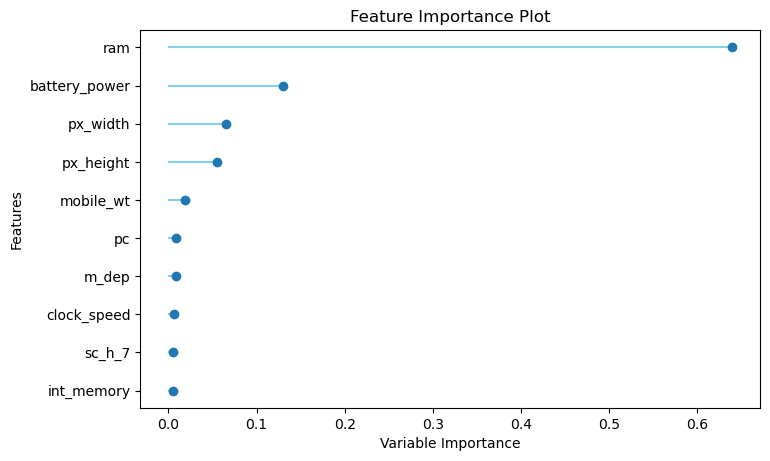

In [100]:
## muestra que features son las mas relevantes para el modelo de dt

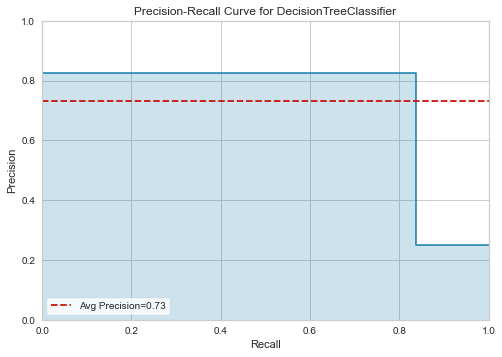

In [102]:
## muestra la curva de precision-recall para el modelo de dt

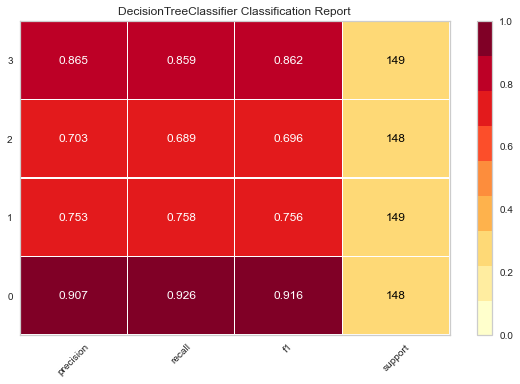

In [104]:
## muestra el classification report para el modelo de dt

In [106]:
evaluate_model(dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### Interpretacion del modelo

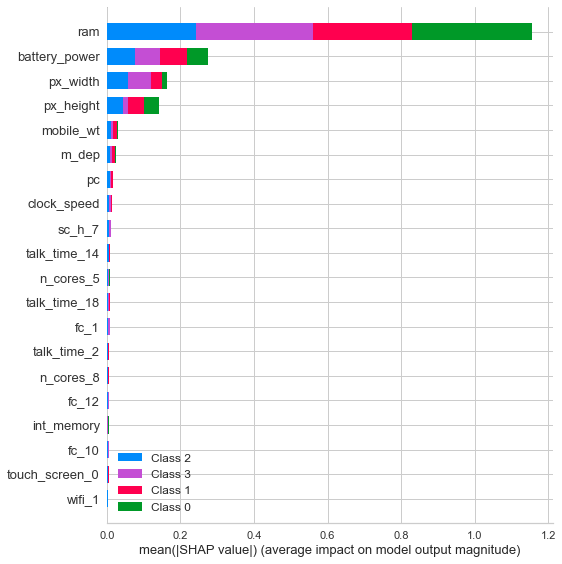

In [109]:
## interpreta el modelo de dt

In [7]:
## interpreta el modelo en base a la correlacion de dt

In [111]:

interpret_model(dt, plot = 'reason', observation = 1)

## AutoML

In [112]:
## entrena un modelo de autoML optimizando el F1 (requeire mucho tiempo de procesamiento, por lo que si no te da error
##el proceso puedes detenerlo)
best

StackingClassifier(cv=10,
                   estimators=[('CatBoostClassifier_0',
                                <catboost.core.CatBoostClassifier object at 0x00000201D3606E48>),
                               ('LogisticRegression_1',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                                                   l1_ratio=None, max_iter=100,
                                                   multi_class='auto',
                                                   n_jobs=None, penalty='l2',
                                                   random_state=786,
                                                   solver='lbfgs', tol=0.0...
                                                 colsample_bynode=1,
                                    

# Finalize Model 

In [113]:
## finaliza el modelo de tuned_catboost

## Guardar y cargar el modelo

In [114]:
## guarda el modelo de tuned_catboost

Transformation Pipeline and Model Succesfully Saved


In [115]:
loaded_final_dt = load_model('best-model')
print(loaded_final_dt)

Transformation Pipeline and Model Successfully Loaded
Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='price_range', time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                numeric_strategy='mean',
                                target_variable=None)),
                ('new_levels1',
                 New_Catagoric...
                ('fix_perfect', Empty()), ('clean_names', Clean_Colum_Names()),
                ('feature_select', Empty()),
                ('fix_multi',
                 Fix_multicollinearity(correlation_with_target_preference=None,
                                   

In [116]:
from sklearn import set_config
set_config(display='diagram')
loaded_final_dt[0]

DataTypes_Auto_infer(categorical_features=[], display_types=False,
                     features_todrop=[], ml_usecase='classification',
                     numerical_features=[], target='price_range',
                     time_features=[])

# Predictions

In [117]:
test = pd.read_csv('data/test.csv')
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [118]:
predictions = predict_model(final_dt, data=test)

In [119]:
predictions.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,Label,Score
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,1412,3476,12,7,2,0,1,0,3,0.7642
1,2,841,1,0.5,1,4,1,61,0.8,191,...,857,3895,6,0,7,1,0,0,3,0.9351
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,1366,2396,17,10,10,0,1,1,2,0.6119
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,1752,3893,10,0,7,1,1,0,3,0.9984
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,810,1773,15,8,7,1,0,1,1,0.9612


## Deploy del modelo

In [120]:
## progrma un despliegue del modelo en amazon web service

NoCredentialsError: Unable to locate credentials

## MlFolow

In [ ]:
## comprueba que tu modelo se encuentra suvido a MlFlow